<a href="https://colab.research.google.com/github/agentdave007/Pollution/blob/main/Pollution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [67]:
from google.colab import drive
drive.mount('/content/gddrive')

Drive already mounted at /content/gddrive; to attempt to forcibly remount, call drive.mount("/content/gddrive", force_remount=True).


Importing data

In [68]:
import pandas as pd
import numpy as np
df = pd.read_csv('/content/gddrive/MyDrive/city_day.csv')
df=df.dropna()
df=df.drop_duplicates()
#preproces=True;
preproces=False;
print(df.head())

           City        Date  PM2.5    PM10    NO    NO2    NOx    NH3    CO  \
2123  Amaravati  2017-11-25  81.40  124.50  1.44  20.50  12.08  10.72  0.12   
2124  Amaravati  2017-11-26  78.32  129.06  1.26  26.00  14.85  10.28  0.14   
2125  Amaravati  2017-11-27  88.76  135.32  6.60  30.85  21.77  12.91  0.11   
2126  Amaravati  2017-11-28  64.18  104.09  2.56  28.07  17.01  11.42  0.09   
2127  Amaravati  2017-11-29  72.47  114.84  5.23  23.20  16.59  12.25  0.16   

        SO2      O3  Benzene  Toluene  Xylene    AQI AQI_Bucket  
2123  15.24  127.09     0.20     6.50    0.06  184.0   Moderate  
2124  26.96  117.44     0.22     7.95    0.08  197.0   Moderate  
2125  33.59  111.81     0.29     7.63    0.12  198.0   Moderate  
2126  19.00  138.18     0.17     5.02    0.07  188.0   Moderate  
2127  10.55  109.74     0.21     4.71    0.08  173.0   Moderate  


In [69]:
print(df)

                City        Date  PM2.5    PM10    NO    NO2    NOx    NH3  \
2123       Amaravati  2017-11-25  81.40  124.50  1.44  20.50  12.08  10.72   
2124       Amaravati  2017-11-26  78.32  129.06  1.26  26.00  14.85  10.28   
2125       Amaravati  2017-11-27  88.76  135.32  6.60  30.85  21.77  12.91   
2126       Amaravati  2017-11-28  64.18  104.09  2.56  28.07  17.01  11.42   
2127       Amaravati  2017-11-29  72.47  114.84  5.23  23.20  16.59  12.25   
...              ...         ...    ...     ...   ...    ...    ...    ...   
29525  Visakhapatnam  2020-06-26   7.63   32.27  5.91  23.27  17.19  11.15   
29526  Visakhapatnam  2020-06-27  15.02   50.94  7.68  25.06  19.54  12.47   
29527  Visakhapatnam  2020-06-28  24.38   74.09  3.42  26.06  16.53  11.99   
29528  Visakhapatnam  2020-06-29  22.91   65.73  3.45  29.53  18.33  10.71   
29529  Visakhapatnam  2020-06-30  16.64   49.97  4.05  29.26  18.80  10.03   

         CO    SO2      O3  Benzene  Toluene  Xylene    AQI    

In [70]:
print(len(df))

6236


In [71]:
print(df.keys())
print(len(df.keys()))

Index(['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'],
      dtype='object')
16


In [72]:
df.City.unique()

array(['Amaravati', 'Amritsar', 'Chandigarh', 'Delhi', 'Gurugram',
       'Hyderabad', 'Kolkata', 'Patna', 'Visakhapatnam'], dtype=object)

In [73]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000
mean,61.327365,123.418321,17.015191,31.708190,32.448956,20.737070,0.984344,11.514426,36.127691,3.700361,10.323696,2.557439,140.510103
std,53.709682,85.791491,20.037836,18.784041,27.388129,16.088215,1.356161,7.166113,19.553695,5.062159,12.287223,4.535060,92.738826
min,2.000000,7.800000,0.250000,0.170000,0.170000,0.120000,0.000000,0.710000,1.550000,0.000000,0.000000,0.000000,23.000000
25%,27.927500,66.970000,5.080000,15.977500,14.547500,10.390000,0.490000,6.557500,22.357500,0.910000,2.210000,0.300000,78.000000
50%,47.490000,103.010000,10.060000,28.900000,24.285000,14.690000,0.730000,9.875000,32.540000,2.435000,6.310000,1.250000,112.000000
75%,73.442500,150.770000,19.392500,43.632500,39.622500,28.545000,1.060000,14.430000,45.512500,4.620000,13.040000,3.030000,166.000000
max,639.190000,796.880000,159.220000,140.170000,224.090000,166.700000,16.230000,70.390000,162.330000,64.440000,103.000000,125.180000,677.000000


In [74]:
for i in range(0,df.shape[1]):
  column=df.columns[i]
  print(column)
  print(df[column].value_counts())

City
Hyderabad        1618
Delhi            1224
Visakhapatnam    1131
Amaravati         646
Amritsar          636
Kolkata           394
Chandigarh        277
Patna             191
Gurugram          119
Name: City, dtype: int64
Date
2020-03-14    9
2020-03-28    9
2020-05-29    9
2020-05-28    9
2020-05-27    9
             ..
2016-02-16    1
2016-02-17    1
2016-02-18    1
2016-02-19    1
2017-02-13    1
Name: Date, Length: 1828, dtype: int64
PM2.5
10.31     6
31.59     5
48.86     5
20.96     5
35.14     5
         ..
174.04    1
168.82    1
203.12    1
206.05    1
16.64     1
Name: PM2.5, Length: 4769, dtype: int64
PM10
94.00     9
87.02     5
93.90     4
112.36    4
61.47     4
         ..
96.00     1
77.40     1
80.82     1
117.21    1
49.97     1
Name: PM10, Length: 5399, dtype: int64
NO
5.24     11
3.95     11
2.81     10
5.28     10
3.03     10
         ..
23.84     1
8.59      1
18.90     1
11.36     1
6.67      1
Name: NO, Length: 2966, dtype: int64
NO2
10.58    8
10.01    8


In [75]:
a=df['Date'].value_counts()
sorted(a)
print(a)

2020-03-14    9
2020-03-28    9
2020-05-29    9
2020-05-28    9
2020-05-27    9
             ..
2016-02-16    1
2016-02-17    1
2016-02-18    1
2016-02-19    1
2017-02-13    1
Name: Date, Length: 1828, dtype: int64


In [76]:
print(df.dtypes)

City           object
Date           object
PM2.5         float64
PM10          float64
NO            float64
NO2           float64
NOx           float64
NH3           float64
CO            float64
SO2           float64
O3            float64
Benzene       float64
Toluene       float64
Xylene        float64
AQI           float64
AQI_Bucket     object
dtype: object


In [77]:
import sklearn
from sklearn.datasets import *

In [78]:
from matplotlib import pyplot as plt

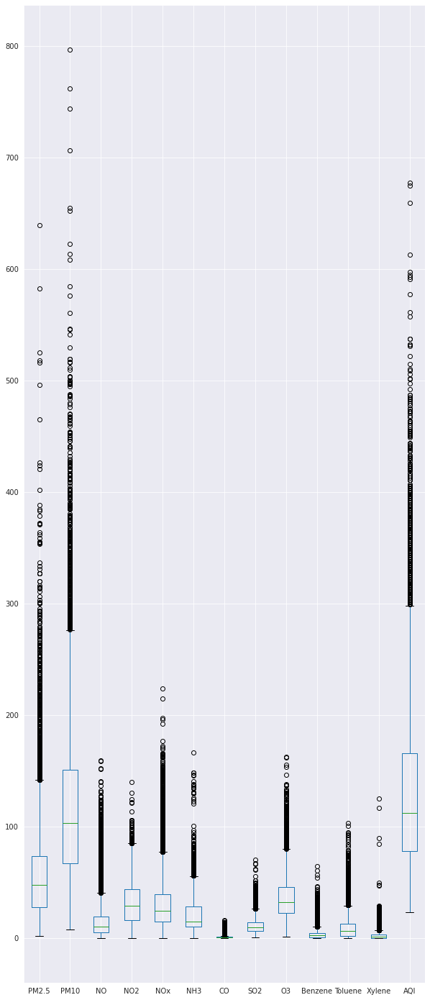

In [79]:
b=plt.figure(figsize = [10, 25]);
df.boxplot()
#b.savefig("b.jpg", format="jpg")

In [80]:
#help(plt.subplot())

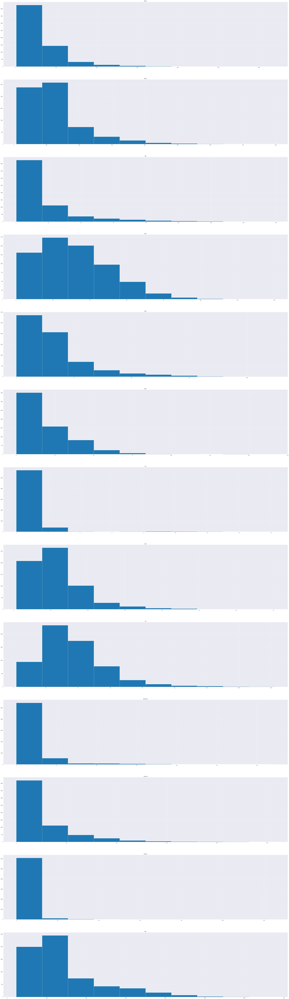

In [81]:
plt.figure(figsize = [60, 500]) 
for i in range(2,df.shape[1]-1):
  print('\n')
  column=df.columns[i]
  plt.subplot(30,1, i+1)
  plt.title(column)
  plt.hist(df[column])
  #print('\n\n\n\n')

In [82]:
import seaborn as sns

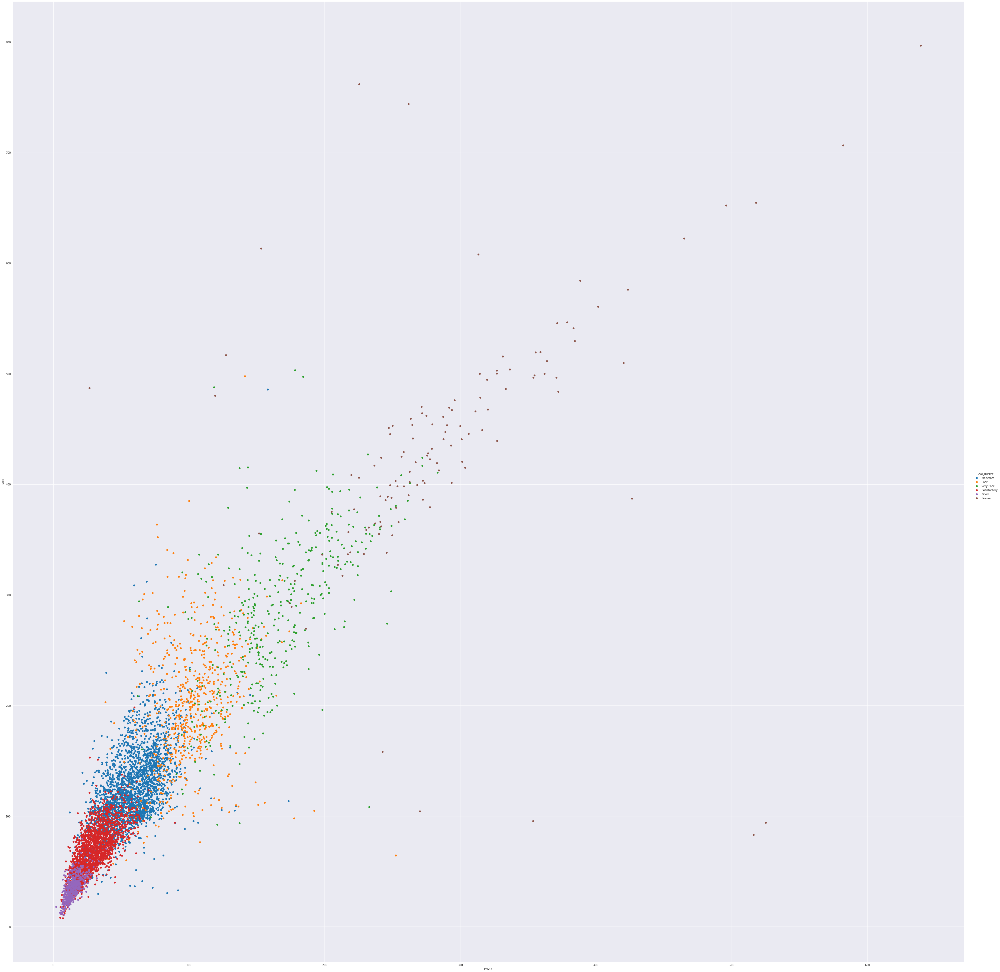

In [83]:
sns.set_style("darkgrid")
sns.FacetGrid(df, hue ="AQI_Bucket", height = 50).map(plt.scatter, 'PM2.5','PM10').add_legend()

In [84]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000,6236.000000
mean,61.327365,123.418321,17.015191,31.708190,32.448956,20.737070,0.984344,11.514426,36.127691,3.700361,10.323696,2.557439,140.510103
std,53.709682,85.791491,20.037836,18.784041,27.388129,16.088215,1.356161,7.166113,19.553695,5.062159,12.287223,4.535060,92.738826
min,2.000000,7.800000,0.250000,0.170000,0.170000,0.120000,0.000000,0.710000,1.550000,0.000000,0.000000,0.000000,23.000000
25%,27.927500,66.970000,5.080000,15.977500,14.547500,10.390000,0.490000,6.557500,22.357500,0.910000,2.210000,0.300000,78.000000
50%,47.490000,103.010000,10.060000,28.900000,24.285000,14.690000,0.730000,9.875000,32.540000,2.435000,6.310000,1.250000,112.000000
75%,73.442500,150.770000,19.392500,43.632500,39.622500,28.545000,1.060000,14.430000,45.512500,4.620000,13.040000,3.030000,166.000000
max,639.190000,796.880000,159.220000,140.170000,224.090000,166.700000,16.230000,70.390000,162.330000,64.440000,103.000000,125.180000,677.000000


In [85]:
import numpy as np
X=df.values[:,2:-3]
X1=df.values[:,2:-3]
Y=df.values[:,-1]
Y1=df.values[:,-3]

In [86]:
print(X.shape)
print(X1.shape)
print(Y.shape)
print(Y1.shape)

(6236, 11)
(6236, 11)
(6236,)
(6236,)


Here we are working on by taking AQI_bucket into index

In [87]:
classLabels=np.unique(Y)
classLabels

array(['Good', 'Moderate', 'Poor', 'Satisfactory', 'Severe', 'Very Poor'],
      dtype=object)

In [88]:
df['AQI_Bucket'].value_counts()

Moderate        2521
Satisfactory    2079
Poor             648
Good             454
Very Poor        410
Severe           124
Name: AQI_Bucket, dtype: int64

In [89]:
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
if preproces == True :
  X=preprocessing.scale(X)
else:
  X=X
print(X)

[[81.4 124.5 1.44 ... 127.09 0.2 6.5]
 [78.32 129.06 1.26 ... 117.44 0.22 7.95]
 [88.76 135.32 6.6 ... 111.81 0.29 7.63]
 ...
 [24.38 74.09 3.42 ... 30.14 0.74 2.21]
 [22.91 65.73 3.45 ... 30.96 0.01 0.01]
 [16.64 49.97 4.05 ... 28.3 0.0 0.0]]


In [90]:
from sklearn.model_selection import train_test_split, cross_val_score
test_val = 0.25
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=test_val)

In [91]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(4677, 11)
(1559, 11)
(4677,)
(1559,)


In [92]:
from sklearn.tree import DecisionTreeClassifier, export_text, export_graphviz
DTclassifer = DecisionTreeClassifier().fit(X_train,Y_train)

In [93]:
import pydotplus
from IPython.display import Image
dot_data=export_graphviz(DTclassifer, feature_names=df.columns[2:-3], class_names=classLabels, filled=True)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.70207 to fit



In [94]:
#print(Y_test)
Y_predict=DTclassifer.predict(X_test)
print(Y_predict)
print(type(Y_predict))

['Satisfactory' 'Satisfactory' 'Good' ... 'Moderate' 'Satisfactory'
 'Moderate']
<class 'numpy.ndarray'>


In [95]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy_score(Y_test, Y_predict)

0.7485567671584349

In [96]:
conf=confusion_matrix(Y_test, Y_predict)
conf

array([[ 86,   3,   0,  35,   0,   0],
       [  2, 508,  47,  74,   0,   2],
       [  0,  32,  93,   2,   0,  21],
       [ 41, 102,   0, 368,   0,   0],
       [  0,   1,   0,   0,  23,   6],
       [  0,   1,  15,   0,   8,  89]])

In [97]:
!pip install mlxtend --upgrade --no-deps

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


(<Figure size 432x288 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f0a289ea990>)

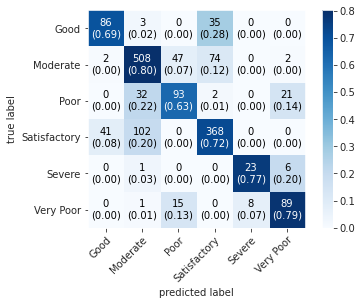

In [98]:
from mlxtend.plotting import plot_confusion_matrix
plot_confusion_matrix(conf_mat=conf, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)

In [99]:
from sklearn.metrics import classification_report
clf_report=classification_report(Y_test, Y_predict, target_names=classLabels, digits=5, output_dict=True)
print(clf_report)

{'Good': {'precision': 0.6666666666666666, 'recall': 0.6935483870967742, 'f1-score': 0.6798418972332015, 'support': 124}, 'Moderate': {'precision': 0.7851622874806801, 'recall': 0.8025276461295419, 'f1-score': 0.79375, 'support': 633}, 'Poor': {'precision': 0.6, 'recall': 0.6283783783783784, 'f1-score': 0.6138613861386139, 'support': 148}, 'Satisfactory': {'precision': 0.7682672233820459, 'recall': 0.7201565557729941, 'f1-score': 0.7434343434343432, 'support': 511}, 'Severe': {'precision': 0.7419354838709677, 'recall': 0.7666666666666667, 'f1-score': 0.7540983606557377, 'support': 30}, 'Very Poor': {'precision': 0.7542372881355932, 'recall': 0.7876106194690266, 'f1-score': 0.7705627705627707, 'support': 113}, 'accuracy': 0.7485567671584349, 'macro avg': {'precision': 0.7193781582559923, 'recall': 0.7331480422522302, 'f1-score': 0.7259247930041112, 'support': 1559}, 'weighted avg': {'precision': 0.7495483155007144, 'recall': 0.7485567671584349, 'f1-score': 0.748676795249292, 'support': 

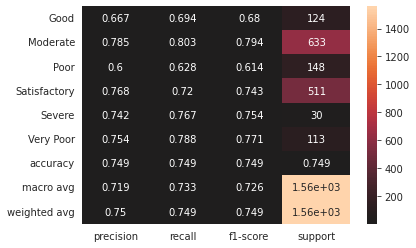

In [100]:
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)#.T is for transpose
                                                                          #.3g is used to display values till three decimal places

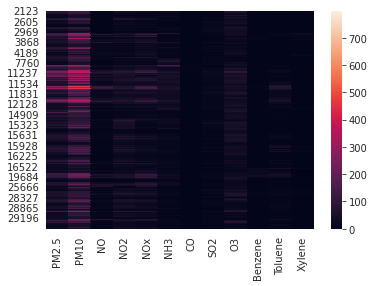

In [101]:
sns.heatmap(df.iloc[: ,2:-2])

<Figure size 7200x36000 with 0 Axes>

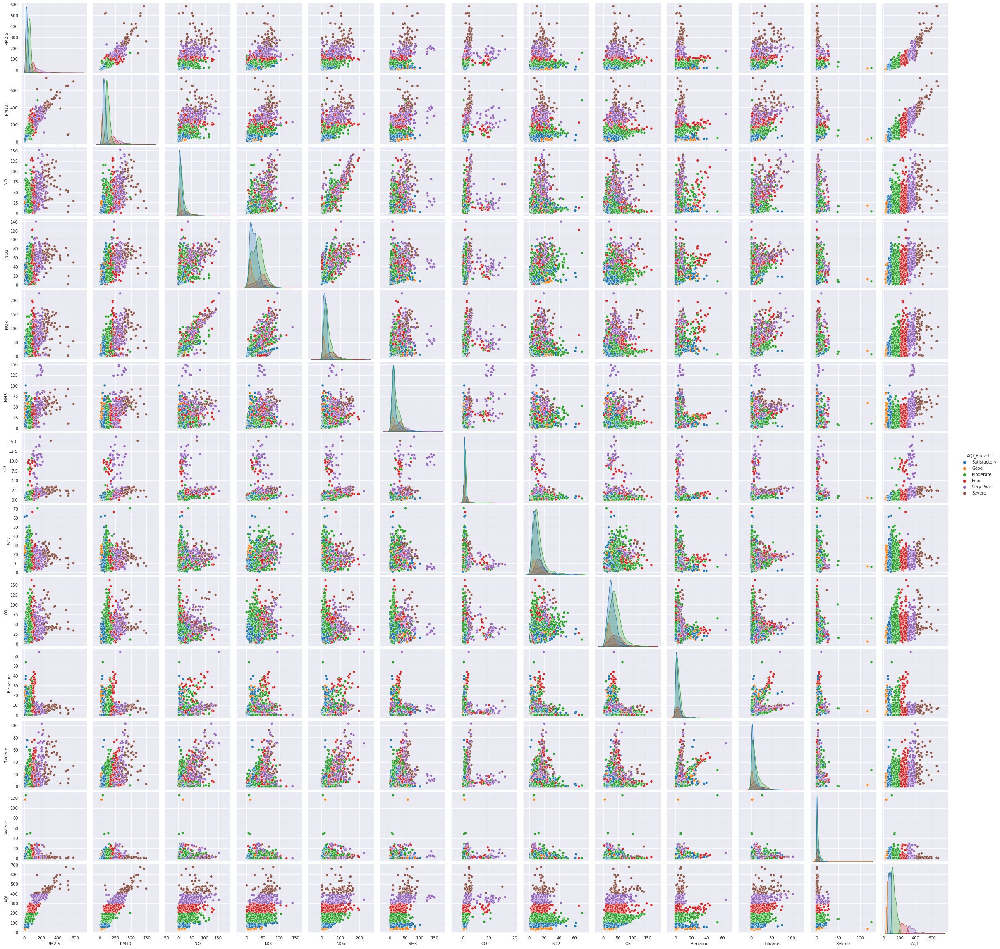

In [112]:
b=plt.figure(figsize = [100, 500]);
sns.pairplot(df[:2:-2],hue='AQI_Bucket')
b.savefig("b.jpg", format="jpg")

Accuracy in decision tree base classifier:
0.7633098139833226
confusion matrix is:
[[ 77   1   0  35   0   0]
 [  2 512  31  79   0   4]
 [  0  24 103   1   0  27]
 [ 35  90   1 403   0   0]
 [  0   0   0   0  26   5]
 [  0   4  20   0  10  69]]
classification report:
{'Good': {'precision': 0.6754385964912281, 'recall': 0.6814159292035398, 'f1-score': 0.6784140969162995, 'support': 113}, 'Moderate': {'precision': 0.8114104595879557, 'recall': 0.8152866242038217, 'f1-score': 0.8133439237490071, 'support': 628}, 'Poor': {'precision': 0.6645161290322581, 'recall': 0.6645161290322581, 'f1-score': 0.6645161290322581, 'support': 155}, 'Satisfactory': {'precision': 0.777992277992278, 'recall': 0.7618147448015122, 'f1-score': 0.7698185291308501, 'support': 529}, 'Severe': {'precision': 0.7222222222222222, 'recall': 0.8387096774193549, 'f1-score': 0.7761194029850746, 'support': 31}, 'Very Poor': {'precision': 0.6571428571428571, 'recall': 0.6699029126213593, 'f1-score': 0.6634615384615384, 'sup

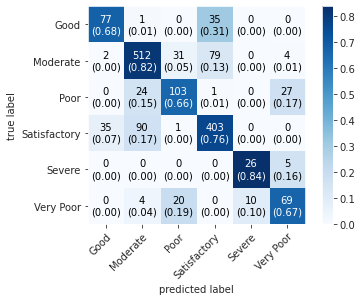

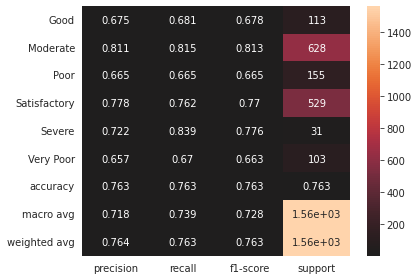

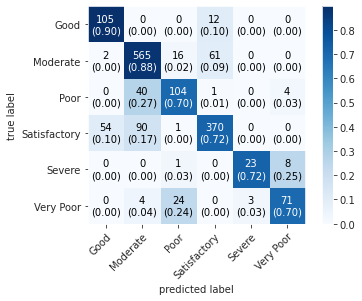

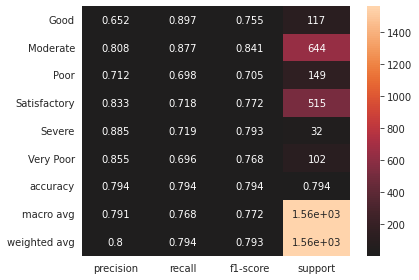

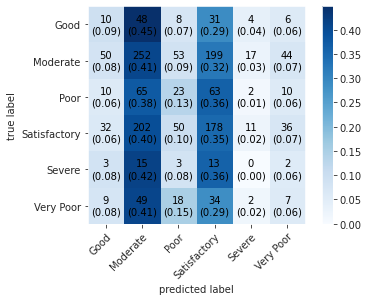

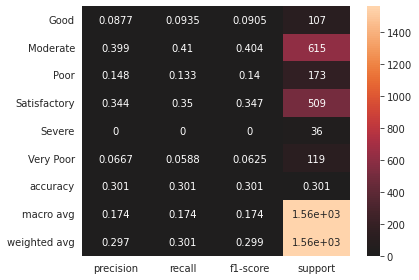

In [151]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import statistics as st
from scipy import stats as s
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.25)
clf = DecisionTreeClassifier(criterion='gini')
clf=clf.fit(X_train,Y_train)
Y_pred=clf.predict(X_test)
a0=accuracy_score(Y_test,Y_pred)
print("Accuracy in decision tree base classifier:")
print(a0)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)
  
#KNN
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.25)
clf1 = KNeighborsClassifier(n_neighbors=4)
clf1=clf1.fit(X_train,Y_train)
Y_pred1=clf1.predict(X_test)
a1=accuracy_score(Y_test,Y_pred)
print("Accuracy in KNN base classifier:")
print(a1)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred1)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred1, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)

#Naive bayes
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.25)
clf2 = GaussianNB()
clf2=clf2.fit(X_train,Y_train)
Y_pred2=clf2.predict(X_test)
a2=accuracy_score(Y_test,Y_pred)
print("Accuracy in naive bayes base classifier:")
print(a2)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)

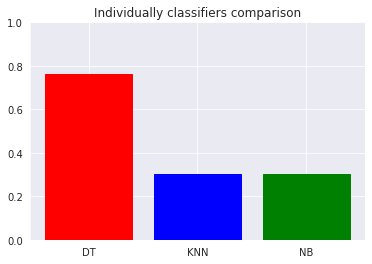

In [152]:
l = ['DT', 'KNN', 'NB']
plt.title('Individually classifiers comparison')
plt.ylim(0,1)
barlist=plt.bar(l,[a0,a1,a2])
barlist[0].set_color('r')
barlist[1].set_color('b')
barlist[2].set_color('g')
plt.show()

Accuracy in combined classifier with DTclassifier on priority:
0.8011545862732521
confusion matrix is:
[[110   0   0  20   0   0]
 [  0 535  17  66   0   1]
 [  0  47 102   0   0   9]
 [ 35  83   0 399   0   0]
 [  0   0   0   0  25   8]
 [  0   1  18   0   5  78]]
classification report:
{'Good': {'precision': 0.7586206896551724, 'recall': 0.8461538461538461, 'f1-score': 0.8, 'support': 130}, 'Moderate': {'precision': 0.8033033033033034, 'recall': 0.864297253634895, 'f1-score': 0.8326848249027237, 'support': 619}, 'Poor': {'precision': 0.7445255474452555, 'recall': 0.6455696202531646, 'f1-score': 0.6915254237288134, 'support': 158}, 'Satisfactory': {'precision': 0.822680412371134, 'recall': 0.7717601547388782, 'f1-score': 0.7964071856287426, 'support': 517}, 'Severe': {'precision': 0.8333333333333334, 'recall': 0.7575757575757576, 'f1-score': 0.7936507936507938, 'support': 33}, 'Very Poor': {'precision': 0.8125, 'recall': 0.7647058823529411, 'f1-score': 0.787878787878788, 'support': 10

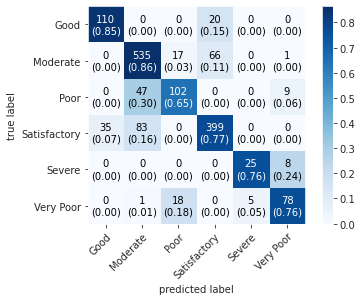

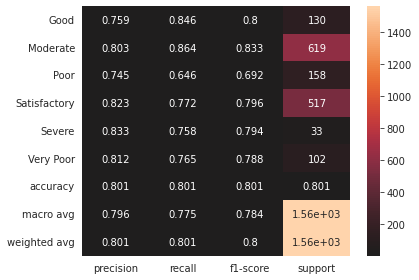

In [153]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.25)
clf0 = DecisionTreeClassifier(criterion='gini')
clf0 = clf0.fit(X_train,Y_train)
clf1 = KNeighborsClassifier(n_neighbors=4)
clf1 = clf1.fit(X_train,Y_train)
clf2 = GaussianNB()
clf2=clf2.fit(X_train,Y_train)
Y_pred0=clf0.predict(X_test)
Y_pred1=clf1.predict(X_test)
Y_pred2=clf2.predict(X_test)
l=np.size(Y_pred0)
#print(l)
arr0=np.concatenate((Y_pred0,Y_pred1,Y_pred2), axis = 0)
arr0=arr0.reshape(3,l).transpose()
#print(Y_pred0)
#print(Y_pred1)
#print(Y_pred2)
#print(arr0)
ar0=list()
for i in range (0,l):
  #print(st.mode(arr[i]))
  ar0.append(str(s.mode(arr0[i])[0][0]))
  #print(str(s.mode(arr[i])[0][0]))

Y_pred=ar0
a0=accuracy_score(Y_test,Y_pred)
print("Accuracy in combined classifier with DTclassifier on priority:")
print(a0)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)

Accuracy in combined classifier with KNN on priority:
0.8011545862732521
confusion matrix is:
[[110   0   0  20   0   0]
 [  0 535  17  66   0   1]
 [  0  47 102   0   0   9]
 [ 35  83   0 399   0   0]
 [  0   0   0   0  25   8]
 [  0   1  18   0   5  78]]
classification report:
{'Good': {'precision': 0.7586206896551724, 'recall': 0.8461538461538461, 'f1-score': 0.8, 'support': 130}, 'Moderate': {'precision': 0.8033033033033034, 'recall': 0.864297253634895, 'f1-score': 0.8326848249027237, 'support': 619}, 'Poor': {'precision': 0.7445255474452555, 'recall': 0.6455696202531646, 'f1-score': 0.6915254237288134, 'support': 158}, 'Satisfactory': {'precision': 0.822680412371134, 'recall': 0.7717601547388782, 'f1-score': 0.7964071856287426, 'support': 517}, 'Severe': {'precision': 0.8333333333333334, 'recall': 0.7575757575757576, 'f1-score': 0.7936507936507938, 'support': 33}, 'Very Poor': {'precision': 0.8125, 'recall': 0.7647058823529411, 'f1-score': 0.787878787878788, 'support': 102}, 'accu

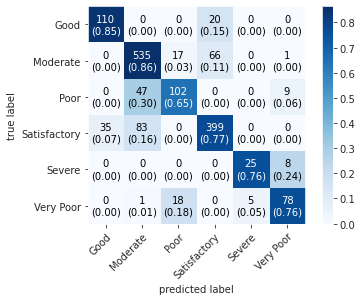

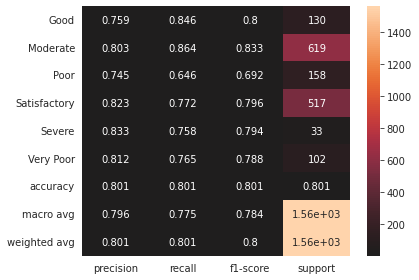

In [154]:
arr1=np.concatenate((Y_pred1,Y_pred0,Y_pred2), axis = 0)
arr1=arr1.reshape(3,l).transpose()
#print(Y_pred0)
#print(Y_pred1)
#print(Y_pred2)
#print(arr)
ar1=list()
for i in range (0,l):
  #print(st.mode(arr[i]))
  ar1.append(str(s.mode(arr1[i])[0][0]))
  #print(str(s.mode(arr[i])[0][0]))

Y_pred=ar1
a1=accuracy_score(Y_test,Y_pred)
print("Accuracy in combined classifier with KNN on priority:")
print(a1)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)

Accuracy in combined classifier with GaussianNB on priority:
0.7382937780628608
confusion matrix is:
[[115   1   0  14   0   0]
 [  0 470  39 106   0   4]
 [  0  43  95   0   0  20]
 [ 74  66   2 375   0   0]
 [  0   0   0   0  27   6]
 [  0   0  12   0  21  69]]
classification report:
{'Good': {'precision': 0.6084656084656085, 'recall': 0.8846153846153846, 'f1-score': 0.7210031347962383, 'support': 130}, 'Moderate': {'precision': 0.8103448275862069, 'recall': 0.7592891760904685, 'f1-score': 0.7839866555462885, 'support': 619}, 'Poor': {'precision': 0.6418918918918919, 'recall': 0.6012658227848101, 'f1-score': 0.6209150326797386, 'support': 158}, 'Satisfactory': {'precision': 0.7575757575757576, 'recall': 0.7253384912959381, 'f1-score': 0.7411067193675889, 'support': 517}, 'Severe': {'precision': 0.5625, 'recall': 0.8181818181818182, 'f1-score': 0.6666666666666666, 'support': 33}, 'Very Poor': {'precision': 0.696969696969697, 'recall': 0.6764705882352942, 'f1-score': 0.6865671641791046

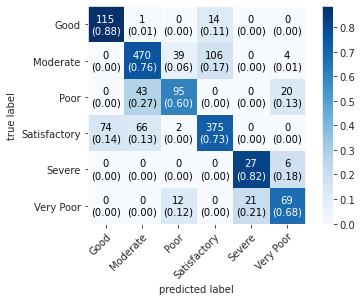

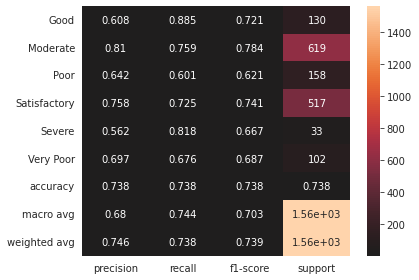

In [155]:
arr2=np.concatenate((Y_pred2,Y_pred1,Y_pred0), axis = 0)
arr=arr2.reshape(3,l).transpose()
#print(Y_pred0)
#print(Y_pred1)
#print(Y_pred2)
#print(arr)
ar2=list()
for i in range (0,l):
  #print(st.mode(arr[i]))
  ar2.append(str(s.mode(arr2[i])[0][0]))
  #print(str(s.mode(arr[i])[0][0]))

Y_pred=ar2
a2=accuracy_score(Y_test,Y_pred)
print("Accuracy in combined classifier with GaussianNB on priority:")
print(a2)
print("confusion matrix is:")
confuss_mat=confusion_matrix(Y_test,Y_pred)
print(confuss_mat)
plot_confusion_matrix(conf_mat=confuss_mat, colorbar=True, show_absolute=True, show_normed=True, class_names=classLabels)
print("classification report:")
clf_report=classification_report(Y_test, Y_pred, target_names=classLabels,digits=4,output_dict=True)
print(clf_report)
plt.subplots(figsize=(6,4), tight_layout=True)
sns.heatmap(pd.DataFrame(clf_report).T, annot=True, fmt='.3g',center=True)

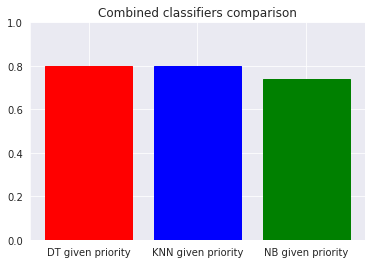

In [157]:
l = ['DT given priority', 'KNN given priority', 'NB given priority']
plt.ylim(0,1)
plt.title('Combined classifiers comparison')
barlist=plt.bar(l,[a0,a1,a2])
barlist[0].set_color('r')
barlist[1].set_color('b')
barlist[2].set_color('g')
plt.show()

In [109]:
#arr = np.array([1,2,2,2,3,3,3,2,2,4,4,9,9,9,9,9,9,4,4,4,4,4,9,8,3,4,5,1,2,1,1,1,9,])
#print(arr)
#print(np.bincount(arr).argmax())
#print(np.bincount(arr))
#print(str(s.mode(a[1])[0]))
#b=[str(s.mode(a)[0]),str(s.mode(a)[1])]
#b=np.ravel(a[0])
#print(type(b))

Here we are taking AQI into index

In [110]:
classLabels1=np.unique(Y1)
classLabels1

array([0.0, 0.01, 0.02, ..., 89.7, 116.62, 125.18], dtype=object)

In [111]:
df['AQI'].value_counts()

106.0    65
102.0    65
100.0    61
60.0     59
110.0    58
         ..
501.0     1
432.0     1
401.0     1
482.0     1
23.0      1
Name: AQI, Length: 452, dtype: int64